In [53]:
from pathlib import Path
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation
from numpy.lib.stride_tricks import sliding_window_view


In [54]:
OUT_DIR = Path("results_cp3")
OUT_DIR.mkdir(exist_ok=True)

def load_rgb(path):
    #Loads an image as an RGB numpy uint8 array
    return np.array(Image.open(path).convert("RGB"), dtype=np.uint8)

def to_uint8(arr):
    #Truncates the value to [0;255] and converts to uint8
    return np.clip(np.rint(arr), 0, 255).astype(np.uint8)


def rgb_to_gray(img):
    #RGB grayscale by standard brightness formula
    if img.ndim == 2:
        return img.astype(np.uint8)
    gray = 0.299 * img[..., 0] + 0.587 * img[..., 1] + 0.114 * img[..., 2]
    return to_uint8(gray)



In [55]:
def show_images(images, titles=None, figsize=None):
    #Displaying multiple images in a row
    n = len(images)
    if titles is None:
        titles = [""] * n
    if figsize is None:
        figsize = (4 * n, 4)

    plt.figure(figsize=figsize)

    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, n, i)

        if img.ndim == 2:
            plt.imshow(img, cmap="gray", vmin=0, vmax=255)
        else:
            plt.imshow(img)

        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [56]:
def resize_to_match(base_img, second_img):
    #Resize second_img to the size of base_img
    h, w = base_img.shape[:2]
    return np.array(
        Image.fromarray(second_img).resize((w, h), Image.Resampling.LANCZOS),
        dtype=np.uint8
    )


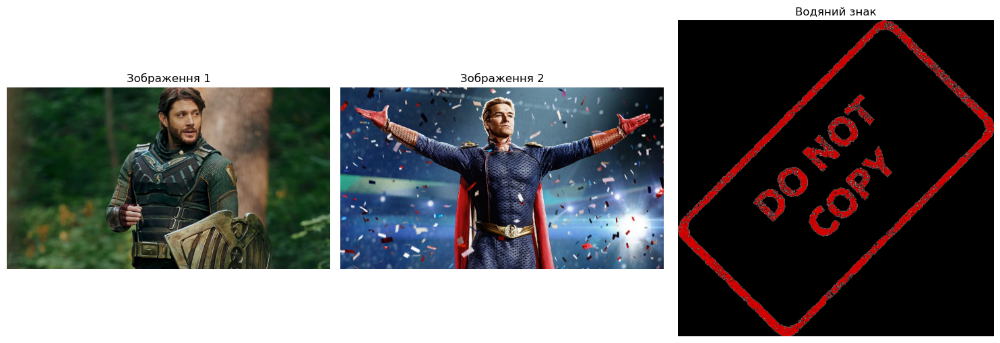

In [57]:
IMAGE1_PATH = "image1.jpg"         
IMAGE2_PATH = "image2.png"          
WATERMARK_PATH = "watermark.png"   

img1 = load_rgb(IMAGE1_PATH)
img2 = load_rgb(IMAGE2_PATH)
watermark = load_rgb(WATERMARK_PATH)

show_images(
    [img1, img2, watermark],
    ["Зображення 1", "Зображення 2", "Водяний знак"],
    figsize=(15, 5)
)


Inverting the color intensity of pixels

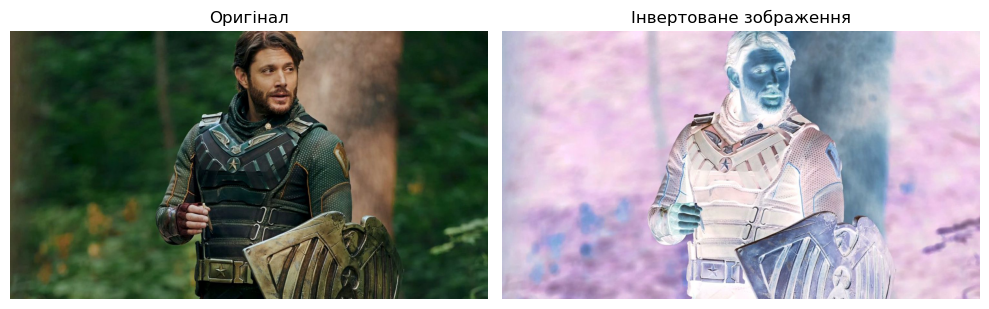

In [58]:
inverted = 255 - img1

show_images(
    [img1, inverted],
    ["Оригінал", "Інвертоване зображення"],
    figsize=(10, 5)
)


Changing a single RGB component

In [59]:
def change_channel(img, channel="G", delta=60):

    #Changes one component of the RGB channel: "R", "G" or "B" delta: positive or negative number

    channel = channel.upper()
    channel_index = {"R": 0, "G": 1, "B": 2}

    if channel not in channel_index:
        raise ValueError("channel має бути 'R', 'G' або 'B'")

    out = img.astype(np.int16).copy()
    out[..., channel_index[channel]] += delta

    return to_uint8(out)


changed_green = change_channel(img1, channel="G", delta=60)
changed_red = change_channel(img1, channel="R", delta=60)
changed_blue = change_channel(img1, channel="B", delta=60)


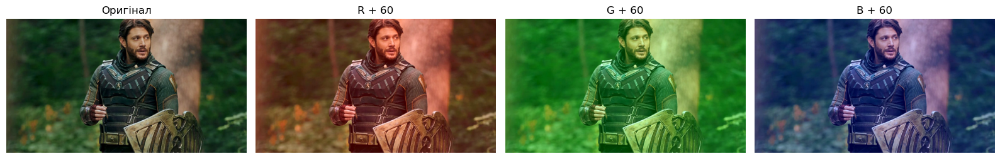

In [60]:
show_images(
    [img1, changed_red, changed_green, changed_blue],
    ["Оригінал", "R + 60", "G + 60", "B + 60"],
    figsize=(16, 5)
)

Splitting the image into Red, Green, Blue components

In [61]:
def split_rgb_components(img):
    # Returns visualizations of individual R, G, B channels
    red = np.zeros_like(img)
    green = np.zeros_like(img)
    blue = np.zeros_like(img)

    red[..., 0] = img[..., 0]
    green[..., 1] = img[..., 1]
    blue[..., 2] = img[..., 2]

    return red, green, blue


red_img, green_img, blue_img = split_rgb_components(img1)


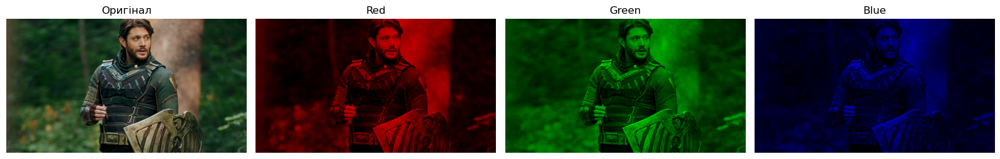

In [62]:
show_images(
    [img1, red_img, green_img, blue_img],
    ["Оригінал", "Red", "Green", "Blue"],
    figsize=(16, 5)
)

Merging two images in the ratio α and 1 − α

In [63]:
def blend_images(img_a, img_b, alpha=0.4):
   # Image_new = alpha * Image1 + (1 - alpha) * Image2.

    if not (0 <= alpha <= 1):
        raise ValueError("alpha має бути в межах [0; 1]")

    img_b_resized = resize_to_match(img_a, img_b)

    result = alpha * img_a.astype(np.float32) + (1 - alpha) * img_b_resized.astype(np.float32)
    return to_uint8(result)


alpha = 0.4
blended = blend_images(img1, img2, alpha=alpha)


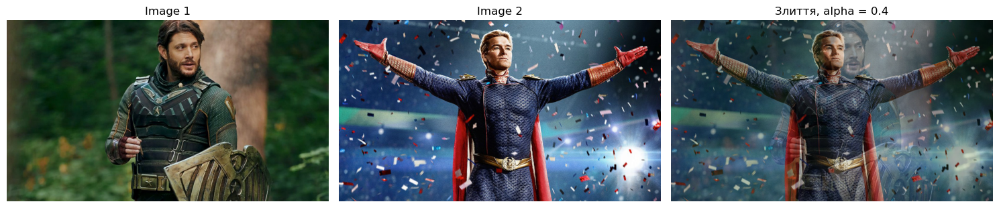

In [64]:
show_images(
    [img1, resize_to_match(img1, img2), blended],
    ["Image 1", "Image 2", f"Злиття, alpha = {alpha}"],
    figsize=(15, 5)
)


Merge animation for variable α

In [65]:
def animate_blending(img_a, img_b, steps=21, interval=150):
    # Smooth transition animation from img_b to img_a
    img_b_resized = resize_to_match(img_a, img_b)
    alphas = np.linspace(0, 1, steps)

    fig, ax = plt.subplots(figsize=(6, 4))
    frame = ax.imshow(blend_images(img_a, img_b_resized, alpha=0))
    title = ax.set_title("alpha = 0.00")
    ax.axis("off")

    def update(i):
        alpha = alphas[i]
        frame.set_data(blend_images(img_a, img_b_resized, alpha=alpha))
        title.set_text(f"alpha = {alpha:.2f}")
        return frame, title

    anim = FuncAnimation(fig, update, frames=len(alphas), interval=interval, blit=False)
    plt.close(fig)

    return HTML(anim.to_jshtml())


In [66]:
display(animate_blending(img1, img2, steps=25, interval=120))

Matrix filters: convolution, blur, sharpness, median, erosion, build-up, Sobel

In [67]:
def convolve_float(img, kernel):
    # Kernel convolution of an image. Returns a float array without truncation of values
    kernel = np.asarray(kernel, dtype=np.float32)
    kh, kw = kernel.shape
    ph, pw = kh // 2, kw // 2

    if img.ndim == 2:
        padded = np.pad(img.astype(np.float32), ((ph, ph), (pw, pw)), mode="edge")
        windows = sliding_window_view(padded, (kh, kw))
        return np.einsum("ijmn,mn->ij", windows, kernel)

    padded = np.pad(img.astype(np.float32), ((ph, ph), (pw, pw), (0, 0)), mode="edge")
    windows = sliding_window_view(padded, (kh, kw), axis=(0, 1))
    return np.einsum("ijcmn,mn->ijc", windows, kernel)


In [68]:
def convolve_image(img, kernel):
    # Convolution with truncation of the result to uint8
    return to_uint8(convolve_float(img, kernel))


In [69]:
def median_filter(img, kernel_size=3):
    # Median filter
    if kernel_size % 2 == 0:
        raise ValueError("kernel_size must be odd")

    r = kernel_size // 2

    if img.ndim == 2:
        padded = np.pad(img, ((r, r), (r, r)), mode="edge")
        windows = sliding_window_view(padded, (kernel_size, kernel_size))
        return np.median(windows, axis=(-2, -1)).astype(np.uint8)

    padded = np.pad(img, ((r, r), (r, r), (0, 0)), mode="edge")
    windows = sliding_window_view(padded, (kernel_size, kernel_size), axis=(0, 1))
    return np.median(windows, axis=(-2, -1)).astype(np.uint8)


STRUCT_ELEMENT = np.array([
    [0, 0, 1, 0, 0],
    [0, 1, 1, 1, 0],
    [1, 1, 1, 1, 1],
    [0, 1, 1, 1, 0],
    [0, 0, 1, 0, 0]
], dtype=bool)


In [70]:
def morphology_filter(img, operation="dilation", struct_element=STRUCT_ELEMENT):
    # Morphological filtering

    se = struct_element.astype(bool)
    kh, kw = se.shape
    ph, pw = kh // 2, kw // 2

    if img.ndim == 2:
        padded = np.pad(img, ((ph, ph), (pw, pw)), mode="edge")
        windows = sliding_window_view(padded, (kh, kw))
        selected = windows[..., se]

        if operation == "dilation":
            return selected.max(axis=-1).astype(np.uint8)
        elif operation == "erosion":
            return selected.min(axis=-1).astype(np.uint8)
        else:
            raise ValueError("operation must be 'dilation' or 'erosion'")

    padded = np.pad(img, ((ph, ph), (pw, pw), (0, 0)), mode="edge")
    windows = sliding_window_view(padded, (kh, kw), axis=(0, 1))
    selected = windows[..., se]

    if operation == "dilation":
        return selected.max(axis=-1).astype(np.uint8)
    elif operation == "erosion":
        return selected.min(axis=-1).astype(np.uint8)
    else:
        raise ValueError("operation must be 'dilation' or 'erosion'")


In [71]:

def normalize_to_uint8(arr):
    # Normalizing a float array to [0;255]
    arr = arr.astype(np.float32)
    mn, mx = arr.min(), arr.max()

    if mx == mn:
        return np.zeros_like(arr, dtype=np.uint8)

    return ((arr - mn) / (mx - mn) * 255).astype(np.uint8)



In [72]:
def sobel_filter(img):
    # Sobel filter: returns the gradient modulus and direction
    gray = rgb_to_gray(img)

    gx_kernel = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ], dtype=np.float32)

    gy_kernel = np.array([
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ], dtype=np.float32)

    gx = convolve_float(gray, gx_kernel)
    gy = convolve_float(gray, gy_kernel)

    magnitude = np.sqrt(gx ** 2 + gy ** 2)
    direction = np.arctan2(gy, gx)

    return normalize_to_uint8(magnitude), direction


gaussian_5x5 = np.array([
    [0.000789, 0.006581, 0.013347, 0.006581, 0.000789],
    [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],
    [0.013347, 0.111345, 0.225821, 0.111345, 0.013347],
    [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],
    [0.000789, 0.006581, 0.013347, 0.006581, 0.000789]
], dtype=np.float32)

sharpen_kernel = np.array([
    [-1, -1, -1],
    [-1,  9, -1],
    [-1, -1, -1]
], dtype=np.float32)


In [73]:
blurred = convolve_image(img1, gaussian_5x5)
sharpened = convolve_image(img1, sharpen_kernel)
median_3 = median_filter(img1, kernel_size=3)
dilated = morphology_filter(img1, operation="dilation")
eroded = morphology_filter(img1, operation="erosion")
sobel_mag, sobel_dir = sobel_filter(img1)


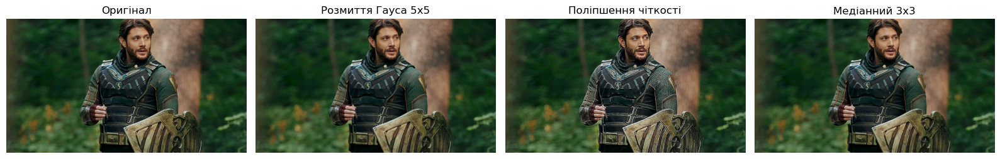

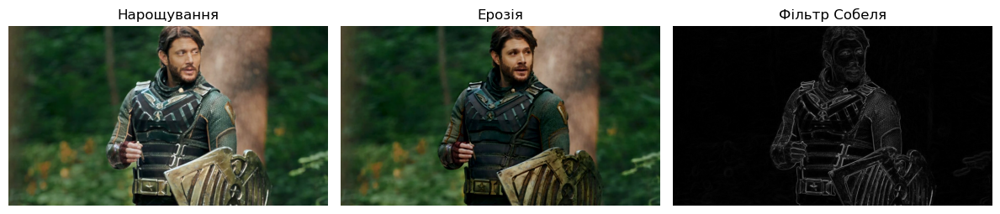

In [74]:
show_images(
    [img1, blurred, sharpened, median_3],
    ["Оригінал", "Розмиття Гауса 5x5", "Поліпшення чіткості", "Медіанний 3x3"],
    figsize=(16, 5)
)

show_images(
    [dilated, eroded, sobel_mag],
    ["Нарощування", "Ерозія", "Фільтр Собеля"],
    figsize=(12, 5)
)


Bit plane layout

In [75]:
def get_channel(img, channel="B"):
    channel = channel.upper()

    if channel == "GRAY":
        return rgb_to_gray(img)

    idx = {"R": 0, "G": 1, "B": 2}

    if channel not in idx:
        raise ValueError("channel must be 'R', 'G', 'B' or 'GRAY'")

    return img[..., idx[channel]]


In [76]:
def bit_planes(img, channel="B"):
    # Returns 8 bit planes of the selected channel
    ch = get_channel(img, channel)

    planes = []
    for p in range(1, 9):
        plane = ((ch >> (p - 1)) & 1) * 255
        planes.append(plane.astype(np.uint8))

    return planes


planes = bit_planes(img1, channel="B")


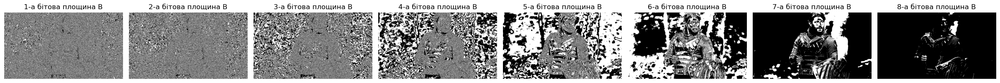

In [77]:
show_images(
    planes,
    [f"{p}-а бітова площина B" for p in range(1, 9)],
    figsize=(24, 4)
)


In [78]:
def binarize_watermark(wm_img, threshold=128, dark_as_one=True):
   # Converts the watermark to a binary 0/1 image
    gray = rgb_to_gray(wm_img)

    if dark_as_one:
        return (gray < threshold).astype(np.uint8)
    else:
        return (gray >= threshold).astype(np.uint8)



In [79]:
def tile_or_crop_watermark(wm_bin, target_shape):
    target_h, target_w = target_shape
    wm_h, wm_w = wm_bin.shape

    reps_h = int(np.ceil(target_h / wm_h))
    reps_w = int(np.ceil(target_w / wm_w))

    tiled = np.tile(wm_bin, (reps_h, reps_w))
    return tiled[:target_h, :target_w].astype(np.uint8)


In [80]:
def embed_watermark_lsb_blue(container_rgb, wm_img, bit_plane=1, threshold=128, dark_as_one=True):
    # Embeds a binary watermark into the selected bitplane of the Blue channel
    if not (1 <= bit_plane <= 8):
        raise ValueError("bit_plane must be a natural number from 1 to 8")

    out = container_rgb.copy()
    h, w = out.shape[:2]

    wm_bin = binarize_watermark(wm_img, threshold=threshold, dark_as_one=dark_as_one)
    wm_prepared = tile_or_crop_watermark(wm_bin, (h, w))

    mask = np.uint8(1 << (bit_plane - 1))
    clear_mask = np.uint8(255 ^ int(mask))

    blue = out[..., 2]
    blue_cleared = blue & clear_mask
    blue_with_wm = blue_cleared | (wm_prepared * mask)

    out[..., 2] = blue_with_wm

    return out, (wm_prepared * 255).astype(np.uint8)


In [81]:
def extract_watermark_lsb_blue(stego_rgb, bit_plane=1):
    #Removes the Blue channel watermark from the selected bitplane
    if not (1 <= bit_plane <= 8):
        raise ValueError("bit_plane must be a natural number from 1 to 8")

    mask = np.uint8(1 << (bit_plane - 1))
    extracted = ((stego_rgb[..., 2] & mask) > 0).astype(np.uint8) * 255

    return extracted.astype(np.uint8)


BIT_PLANE = 8  


In [82]:
stego_img, wm_binary_used = embed_watermark_lsb_blue(
    container_rgb=img1,
    wm_img=watermark,
    bit_plane=BIT_PLANE,
    threshold=128,
    dark_as_one=True
)

extracted_wm = extract_watermark_lsb_blue(stego_img, bit_plane=BIT_PLANE)


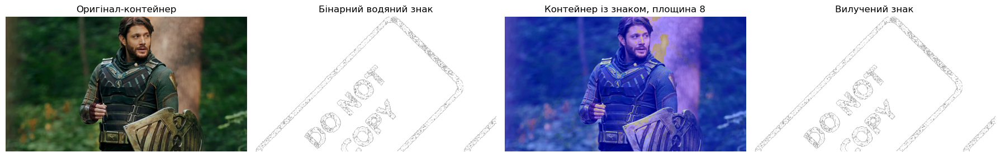

In [83]:
show_images(
    [img1, wm_binary_used, stego_img, extracted_wm],
    [
        "Оригінал-контейнер",
        "Бінарний водяний знак",
        f"Контейнер із знаком, площина {BIT_PLANE}",
        "Вилучений знак"
    ],
    figsize=(18, 5)
)


Comparison of embedding in different bit planes

In [84]:
bitplane_results = []

for p in range(1, 9):
    stego_p, _ = embed_watermark_lsb_blue(
        container_rgb=img1,
        wm_img=watermark,
        bit_plane=p,
        threshold=128,
        dark_as_one=True
    )
    bitplane_results.append(stego_p)


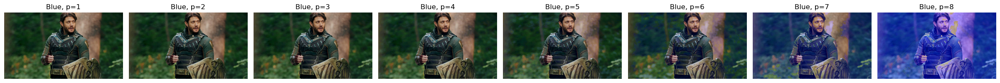

In [85]:
show_images(
    bitplane_results,
    [f"Blue, p={p}" for p in range(1, 9)],
    figsize=(24, 4)
)
